In [1]:
 # need notebook backend for interaction
%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt

# file-handling stuff for user, options abound! I like Tables and Pandas DataFrames
import pandas as pd
from astropy.table import Table
from astropy import units as u

# import kosmos... if we do it right this should be the only other thing to import someday!
import sys  
sys.path.append('/Users/james/Dropbox/research_projects/kosmos/')

import kosmos
kosmos.__version__

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



'0.02'

In [2]:
DISPLAY=True

In [3]:
biasfiles_i = pd.read_table('biaslist.txt', names=['impath'])
biasfiles =  biasfiles_i['impath'].values
biasfiles

array(['bias.0001.fits', 'bias.0002.fits', 'bias.0003.fits',
       'bias.0004.fits', 'bias.0005.fits', 'bias.0006.fits',
       'bias.0007.fits', 'bias.0008.fits', 'bias.0009.fits',
       'bias.0010.fits', 'bias.0011.fits'], dtype=object)

In [4]:
bias = kosmos.biascombine(biasfiles) 
print(bias.shape)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.
 [astropy.io.fits.verify]

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected.
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected.
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected.
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected.


(4096, 2148)


<IPython.core.display.Javascript object>


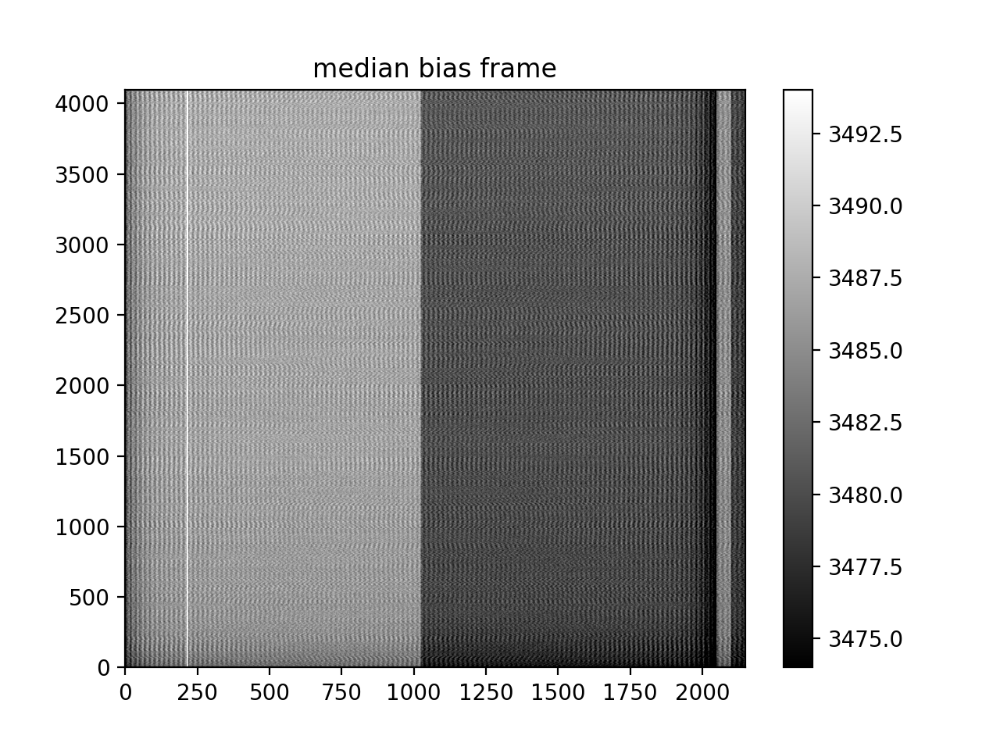

In [5]:
plt.imshow(bias, origin='lower', aspect='auto', cmap=plt.cm.gray)
plt.title('median bias frame')
plt.clim(np.percentile(bias, (5, 98)))
cb = plt.colorbar()

<IPython.core.display.Javascript object>


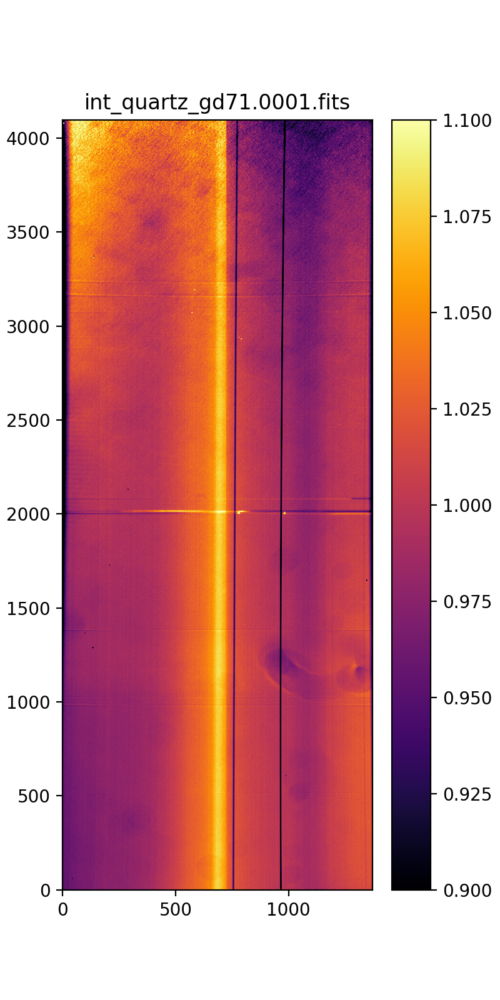

(1368,)
(4096, 1372)
adu / s


In [52]:
flatfiles = ['int_quartz_gd71.0001.fits']
# flatfiles = ['truss_quartz_gd71.0001.fits']
flat, ilum = kosmos.flatcombine(flatfiles, bias=bias, 
                                trim=False, illumcor=True, 
                                responsecor=True, Waxis=0, Saxis=1)

plt.figure(figsize=(4,8))
plt.imshow(flat, origin='lower', aspect='auto', cmap=plt.cm.inferno)
plt.clim(.9,1.1)
plt.title('int_quartz_gd71.0001.fits')
cb = plt.colorbar()
# plt.savefig('int_quartz_gd71.0001.fits.png', dpi=150, bbox_inches='tight', pad_inches=0.25)

print(ilum.shape) # this is the indicies that are illuminated
print(flat.shape)
print(flat.unit)

<IPython.core.display.Javascript object>


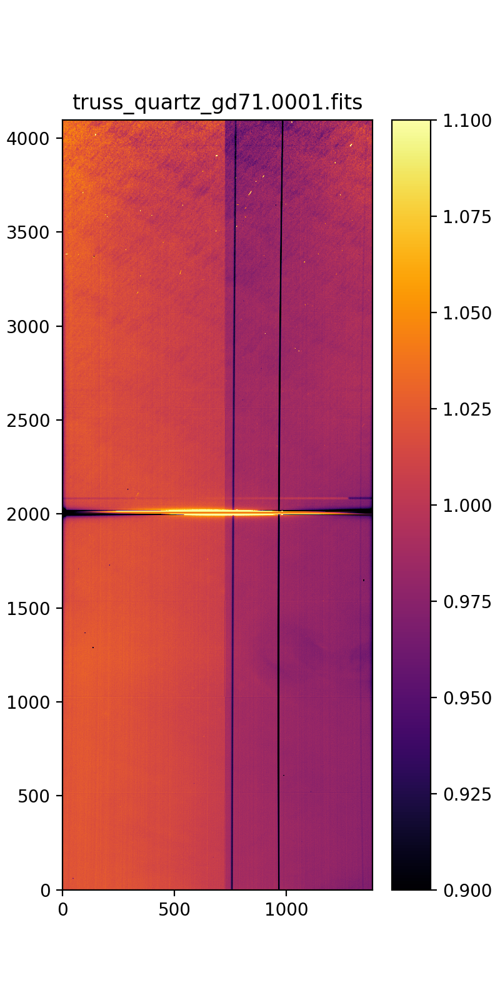

(1380,)
(4096, 1385)
adu / s


In [53]:
# flatfiles = ['int_quartz_gd71.0001.fits']
flatfiles = ['truss_quartz_gd71.0001.fits']
flat, ilum = kosmos.flatcombine(flatfiles, bias=bias, 
                                trim=False, illumcor=True, 
                                responsecor=True, Waxis=0, Saxis=1)

plt.figure(figsize=(4,8))
plt.imshow(flat, origin='lower', aspect='auto', cmap=plt.cm.inferno)
plt.clim(.9,1.1)
plt.title('truss_quartz_gd71.0001.fits')
cb = plt.colorbar()
# plt.savefig('truss_quartz_gd71.0001.fits.png', dpi=150, bbox_inches='tight', pad_inches=0.25)

print(ilum.shape) # this is the indicies that are illuminated
print(flat.shape)
print(flat.unit)

In [58]:
[flatfiles[0]]

['int_quartz_qyaur.0001.fits']

<IPython.core.display.Javascript object>


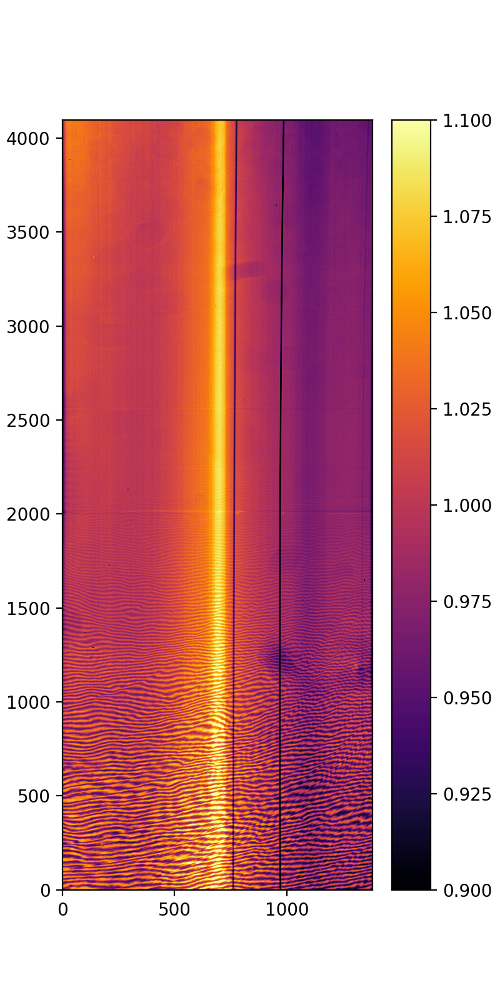

In [63]:
# flatfiles = ['int_quartz_gd71.0001.fits']
# flatfiles = ['truss_quartz_gd71.0001.fits']

flatfiles_i = pd.read_table('flat_qyaur.txt', names=['impath'])
flatfiles = flatfiles_i['impath'].values
flatfiles

flat, ilum = kosmos.flatcombine(flatfiles[0:5], bias=bias, 
                                trim=False, illumcor=True, 
                                responsecor=True, Waxis=0, Saxis=1)

plt.figure(figsize=(4,8))
plt.imshow(flat, origin='lower', aspect='auto', cmap=plt.cm.inferno)
plt.clim(.9,1.1)
# plt.title('int_quartz_gd71.0001.fits')
cb = plt.colorbar()
# plt.savefig('int_quartz_gd71.0001.fits.png', dpi=150, bbox_inches='tight', pad_inches=0.25)


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.


(4096, 1385)
adu / s


<IPython.core.display.Javascript object>


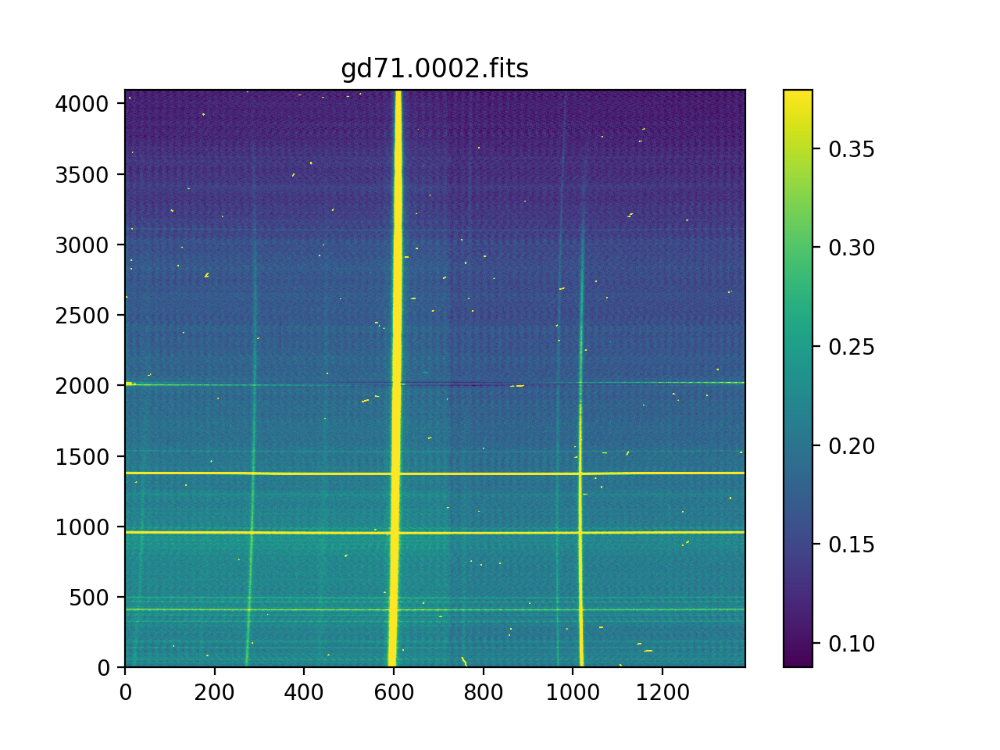

In [15]:
fcal = 'gd71.0002.fits'  # spectrum of standard star, GD71
calimg = kosmos.proc(fcal, bias=bias, ilum=ilum, flat=flat, trim=False, Waxis=0)

sci = 'qyaur.0002.fits'
sciimg = kosmos.proc(sci, bias=bias, ilum=ilum, flat=flat, trim=False, Waxis=0)


print(calimg.shape)
print(calimg.unit)

if DISPLAY:
#     plt.figure(figsize=(6,3))
    plt.imshow(calimg, origin='lower', aspect='auto')
    plt.clim(np.percentile(calimg, (5, 98)))
    cb = plt.colorbar()
    plt.title(fcal)

/Users/james/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:753: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


<IPython.core.display.Javascript object>


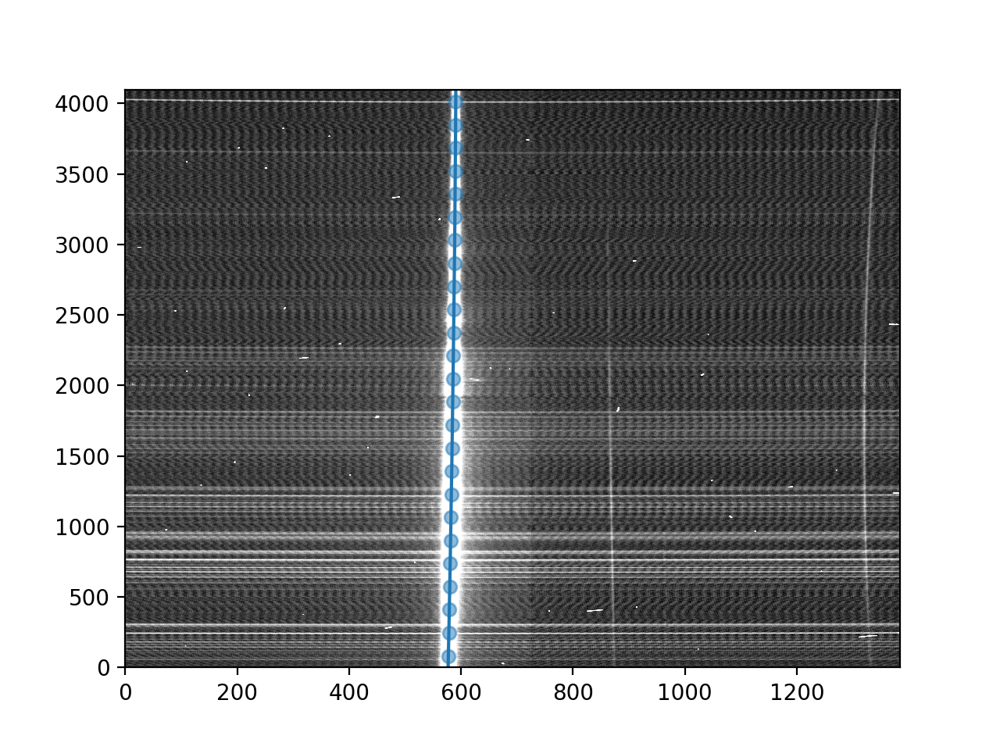

In [18]:
cal_trace = kosmos.trace(calimg, display=False, nbins=25, Waxis=0)
sci_trace = kosmos.trace(sciimg, display=DISPLAY, nbins=25, Waxis=0)

In [48]:
print(cal_trace.shape)
cal_trace

(4096,)


array([596.66715861, 596.67379298, 596.68042475, ..., 609.86742227,
       609.86672322, 609.86601649])

<IPython.core.display.Javascript object>


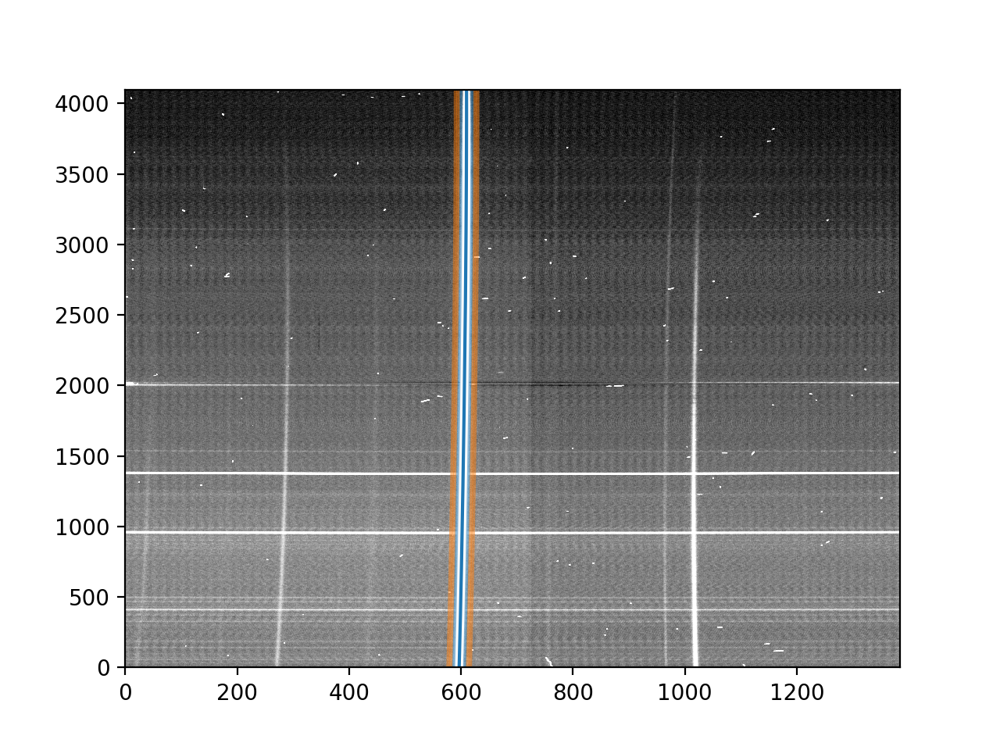

In [20]:
cal_ex, cal_sky = kosmos.BoxcarExtract(calimg, cal_trace, display=True, 
                                       apwidth=10, skysep=5, skywidth=5, Waxis=0)

sci_ex, sci_sky = kosmos.BoxcarExtract(sciimg, sci_trace, display=False,
                                       apwidth=10, skysep=5, skywidth=5, Waxis=0)

<IPython.core.display.Javascript object>


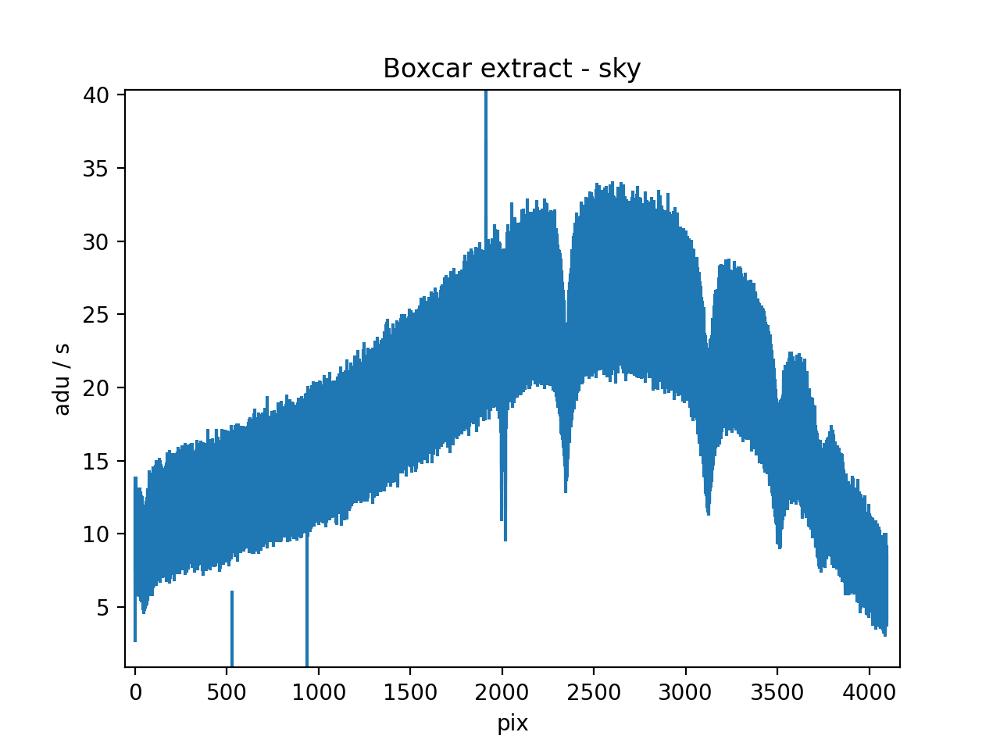

Text(0.5, 1.0, 'Boxcar extract - sky')

In [12]:
plt.errorbar(cal_ex.spectral_axis.value, cal_ex.flux.value - cal_sky.flux.value, 
             yerr=cal_ex.uncertainty.array, linestyle='none')
plt.xlabel(cal_ex.spectral_axis.unit)
plt.ylabel(cal_ex.flux.unit)
plt.title('Boxcar extract - sky')

<IPython.core.display.Javascript object>


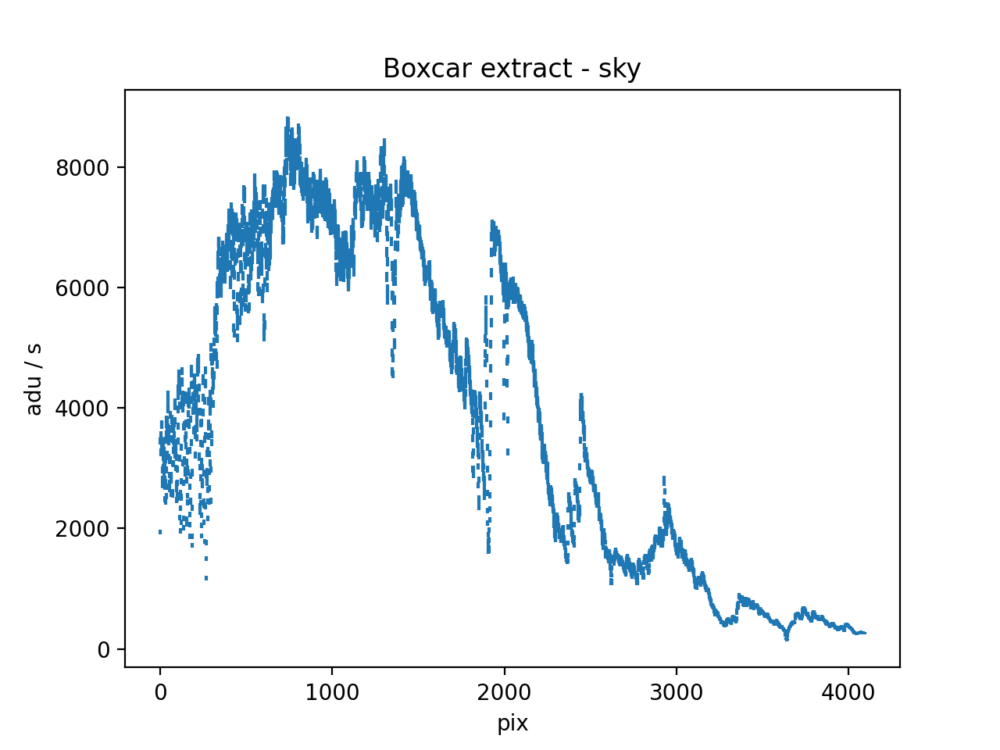

Text(0.5, 1.0, 'Boxcar extract - sky')

In [22]:
plt.errorbar(sci_ex.spectral_axis.value, sci_ex.flux.value - sci_sky.flux.value, 
             yerr=sci_ex.uncertainty.array, linestyle='none')
plt.xlabel(sci_ex.spectral_axis.unit)
plt.ylabel(sci_ex.flux.unit)
plt.title('Boxcar extract - sky')

In [23]:
arcfile1 = 'int_neon_gd71.0002.fits'
arcfile2 = 'truss_neon_gd71.0002.fits'

arcimg1 = kosmos.proc(arcfile1, bias=bias, ilum=ilum, flat=flat, trim=False, Waxis=0) 
arcimg2 = kosmos.proc(arcfile2, bias=bias, ilum=ilum, flat=flat, trim=False, Waxis=0) 


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.


<IPython.core.display.Javascript object>


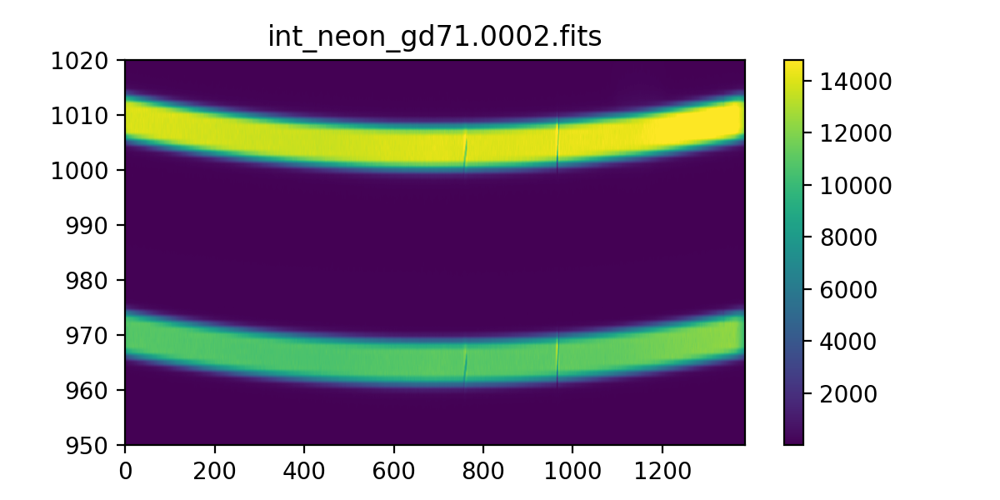

(950.0, 1020.0)

In [64]:
plt.figure(figsize=(6,3))
plt.imshow(arcimg1, origin='lower', aspect='auto')
plt.clim(np.percentile(arcimg1, (5, 98)))
cb = plt.colorbar()
plt.title(arcfile1)
plt.ylim(950,1020)

<IPython.core.display.Javascript object>


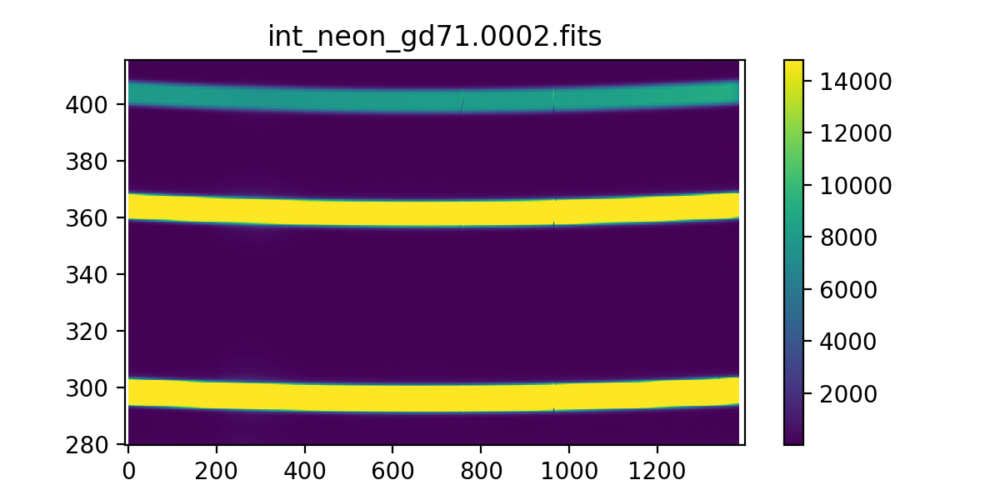

Text(0.5, 1.0, 'int_neon_gd71.0002.fits')

In [65]:
plt.figure(figsize=(6,3))
plt.imshow(arcimg1, origin='lower', aspect='auto')
plt.clim(np.percentile(arcimg1, (5, 98)))
cb = plt.colorbar()
plt.title(arcfile1)
# plt.ylim(950,1020)

<IPython.core.display.Javascript object>


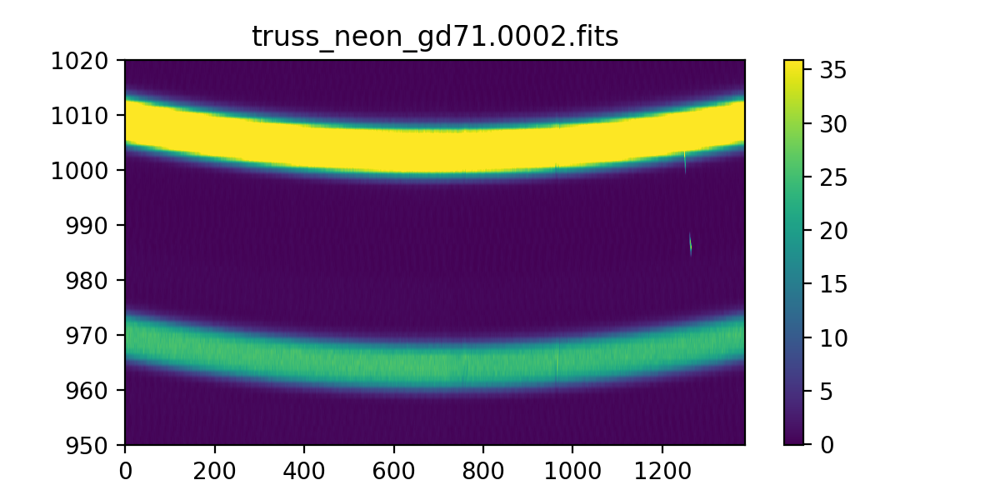

(950.0, 1020.0)

In [45]:
plt.figure(figsize=(6,3))
plt.imshow(arcimg2, origin='lower', aspect='auto')
plt.clim(np.percentile(arcimg2, (5, 98)))
cb = plt.colorbar()
plt.title(arcfile2)
plt.ylim(950,1020)

In [40]:
sciarc_ex1, _ = kosmos.BoxcarExtract(arcimg1, sci_trace, apwidth=3, skysep=5, skywidth=5, Waxis=0)
sciarc_ex2, _ = kosmos.BoxcarExtract(arcimg2, sci_trace, apwidth=3, skysep=5, skywidth=5, Waxis=0)

calarc_ex1, _ = kosmos.BoxcarExtract(arcimg1, cal_trace, apwidth=3, skysep=5, skywidth=5, Waxis=0)
calarc_ex2, _ = kosmos.BoxcarExtract(arcimg2, cal_trace, apwidth=3, skysep=5, skywidth=5, Waxis=0)

/Users/james/Dropbox/research_projects/kosmos/kosmos/apextract.py:316: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


<IPython.core.display.Javascript object>


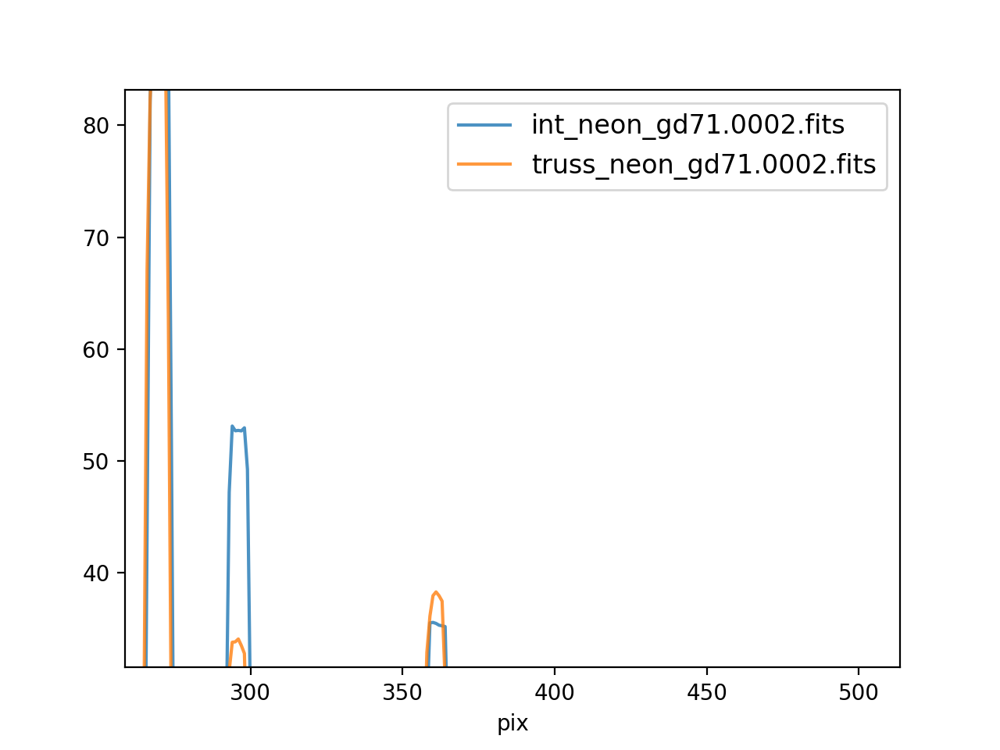

Text(0.5, 0, 'pix')

In [39]:
plt.plot(sciarc_ex1.spectral_axis.value, sciarc_ex1.flux.value/np.nanmean(sciarc_ex1.flux), label=arcfile1,alpha=0.8)
plt.plot(sciarc_ex2.spectral_axis.value, sciarc_ex2.flux.value/np.nanmean(sciarc_ex2.flux), label=arcfile2,alpha=0.8)
plt.legend(fontsize=12)
plt.xlabel(sciarc_ex1.spectral_axis.unit)
# plt.ylabel(sciarc_ex1.flux.unit)

<IPython.core.display.Javascript object>


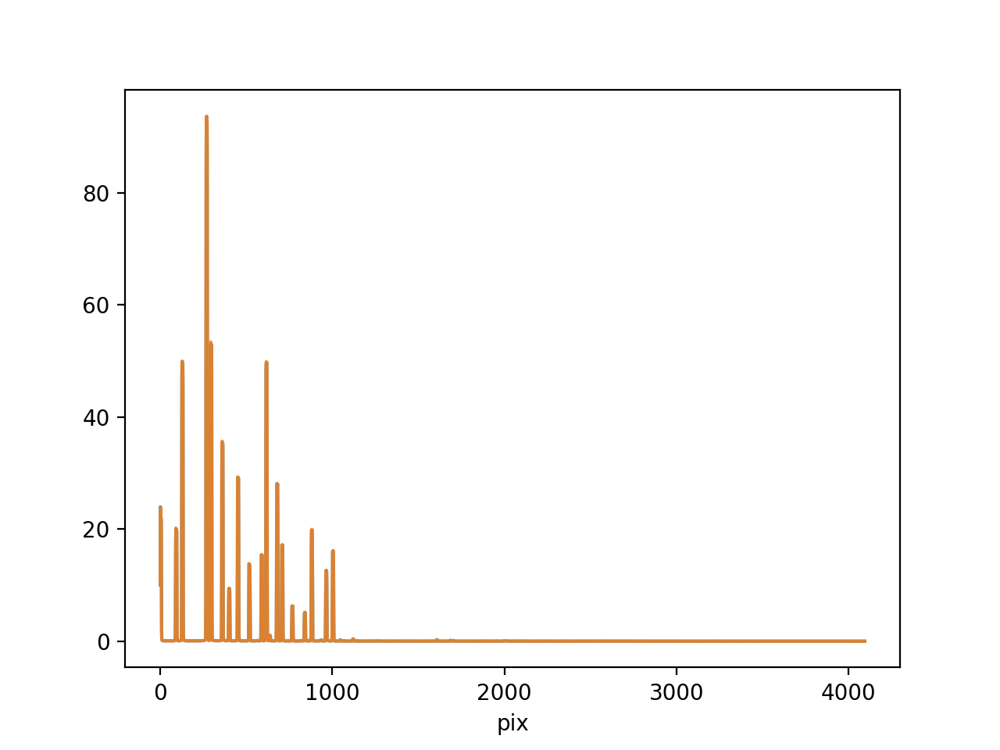

Text(0.5, 0, 'pix')

In [42]:
plt.plot(sciarc_ex1.spectral_axis.value, sciarc_ex1.flux.value/np.nanmean(sciarc_ex1.flux), label=arcfile1,alpha=0.8)
plt.plot(calarc_ex1.spectral_axis.value, calarc_ex1.flux.value/np.nanmean(calarc_ex1.flux), label=arcfile1,alpha=0.8)
# plt.legend(fontsize=12)
plt.xlabel(sciarc_ex1.spectral_axis.unit)

